# Learning Functions Part 2

In this notebook we'll extend the task of adding two numbers over sequences. Given ([1,2,3], [4,5,6]) the recurrent network should learn to add each pair of numbers and keep track of the result:

```
1 + 4 = 5
2 + 5 + 5 = 12
6 + 3 + 12 = 21
```

In [1]:
# Load environment
using Pkg
Pkg.activate("..")

"/Users/domluna/github/NeuralArithmetic/Project.toml"

In [2]:
using NeuralArithmetic
using Flux
using Plots
import Distributions: Uniform
import Statistics: mean

In [3]:
# number of training set examples
N = 500

500

The dataset of a function will contain `N` training examples, 50 validation examples (interpolation), and 50 testing examples (extrapolation).

In [4]:
dist = Uniform(1, 10)
# N sequences of length 1 to 10
train_seqs = [rand(dist, 2, 10) for _ in 1:N]
# (interpolation)
val_seqs = [rand(dist, 2, 10) for _ in 1:50]
# (extrapolation) sequences longer than shown
test_seqs = [rand(dist, 2, 1000) for _ in 1:50]

50-element Array{Array{Float64,2},1}:
 [8.46837 5.70068 … 3.48084 3.48149; 5.49103 2.11268 … 9.55769 7.56394]
 [5.46268 8.92171 … 4.79139 5.89264; 5.78921 7.88077 … 8.05152 4.10435]
 [9.95575 9.18735 … 1.32735 4.59202; 6.19985 3.40202 … 9.26952 3.78672]
 [8.30515 4.64909 … 2.89462 4.12677; 1.67564 6.83456 … 9.319 8.20542]  
 [1.37898 8.96872 … 4.03398 8.8682; 2.92727 8.79807 … 5.04855 4.91588] 
 [4.51535 6.91268 … 1.78142 8.50659; 1.65209 3.61291 … 8.23997 1.96612]
 [8.28482 3.12469 … 9.14332 2.85797; 5.36576 2.70233 … 1.86377 4.43315]
 [6.23973 5.9818 … 9.52999 4.16994; 8.89848 5.60985 … 7.33199 8.73999] 
 [1.39129 3.78453 … 8.19259 4.17105; 8.50394 2.00647 … 5.97696 5.26986]
 [8.80272 2.75404 … 7.46236 4.37672; 6.22764 9.46327 … 9.0421 6.04149] 
 [7.04308 4.86448 … 6.52313 2.91658; 3.58275 3.87743 … 4.07437 2.53788]
 [7.70818 4.4523 … 6.79304 2.72272; 9.20531 1.29995 … 2.31806 3.60123] 
 [9.20859 1.51114 … 2.13791 4.65897; 3.90582 7.02343 … 3.00164 1.3047] 
 ⋮                        

In [5]:
function f(m, x)
    state = m[1].(x)[end]
    # reset hidden state of recurrent node on each sequence
    Flux.reset!(m[1])
    m[2:end](state)
end

loss(f, m) = (x, y) -> Flux.mse(f(m, x), y)

function train_model(lossf, opt, train_data, val_data, epochs::Int)
    hist = zeros(epochs)
    for i in 1:epochs
        Flux.train!(lossf, train_data, opt) 
        val_loss = Flux.data(mean(lossf(d...) for d in val_data))
        if i % 10 == 0
            @info "Iteration $i - Validation loss = $val_loss"
        end
        hist[i] = val_loss
    end
    return hist
end

train_model (generic function with 1 method)

Let's run the experiments and plot results.

In [6]:
epochs = 500

500

### `+` Data

In [7]:
add_data_train = [(s, sum(reduce(+, s, dims=1))) for s in train_seqs]
add_data_val = [(s, sum(reduce(+, s, dims=1))) for s in val_seqs]
add_data_test = [(s, sum(reduce(+, s, dims=1))) for s in test_seqs]

50-element Array{Tuple{Array{Float64,2},Float64},1}:
 ([8.46837 5.70068 … 3.48084 3.48149; 5.49103 2.11268 … 9.55769 7.56394], 10982.28231915257) 
 ([5.46268 8.92171 … 4.79139 5.89264; 5.78921 7.88077 … 8.05152 4.10435], 11039.399984233149)
 ([9.95575 9.18735 … 1.32735 4.59202; 6.19985 3.40202 … 9.26952 3.78672], 11098.871183586767)
 ([8.30515 4.64909 … 2.89462 4.12677; 1.67564 6.83456 … 9.319 8.20542], 10971.408387488018)  
 ([1.37898 8.96872 … 4.03398 8.8682; 2.92727 8.79807 … 5.04855 4.91588], 11157.435432359616) 
 ([4.51535 6.91268 … 1.78142 8.50659; 1.65209 3.61291 … 8.23997 1.96612], 10820.063770740098)
 ([8.28482 3.12469 … 9.14332 2.85797; 5.36576 2.70233 … 1.86377 4.43315], 11025.386394012441)
 ([6.23973 5.9818 … 9.52999 4.16994; 8.89848 5.60985 … 7.33199 8.73999], 11194.588941637514) 
 ([1.39129 3.78453 … 8.19259 4.17105; 8.50394 2.00647 … 5.97696 5.26986], 10923.342130429823)
 ([8.80272 2.75404 … 7.46236 4.37672; 6.22764 9.46327 … 9.0421 6.04149], 11028.41431429196)  
 ([7.04

## `LSTM + Dense`

┌ Info: Iteration 10 - Validation loss = 17278.01855930981
└ @ Main In[5]:16
┌ Info: Iteration 20 - Validation loss = 12384.910500706634
└ @ Main In[5]:16
┌ Info: Iteration 30 - Validation loss = 8359.731935835156
└ @ Main In[5]:16
┌ Info: Iteration 40 - Validation loss = 5189.406845298551
└ @ Main In[5]:16
┌ Info: Iteration 50 - Validation loss = 2858.746310458826
└ @ Main In[5]:16
┌ Info: Iteration 60 - Validation loss = 1338.573873884158
└ @ Main In[5]:16
┌ Info: Iteration 70 - Validation loss = 558.5070242474252
└ @ Main In[5]:16
┌ Info: Iteration 80 - Validation loss = 323.5568853299942
└ @ Main In[5]:16
┌ Info: Iteration 90 - Validation loss = 298.4159920026125
└ @ Main In[5]:16
┌ Info: Iteration 100 - Validation loss = 299.4262179872499
└ @ Main In[5]:16
┌ Info: Iteration 110 - Validation loss = 259.08198623152055
└ @ Main In[5]:16
┌ Info: Iteration 120 - Validation loss = 97.08305076956874
└ @ Main In[5]:16
┌ Info: Iteration 130 - Validation loss = 57.79707348686767
└ @ Main In

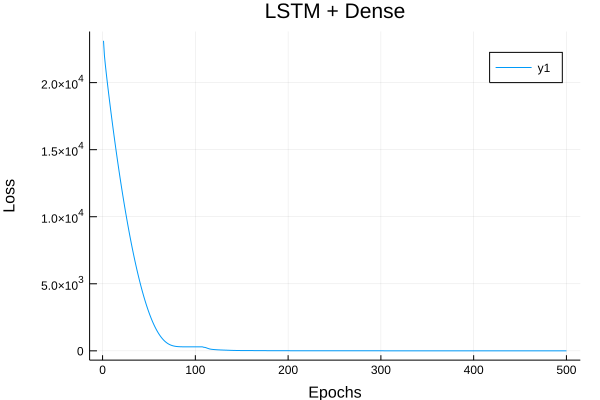

In [8]:
lstm = Chain(LSTM(2, 2), Dense(2, 1))
lstm_opt = ADAM(params(lstm))
lstm_loss = loss(f, lstm)
hist = train_model(lstm_loss, lstm_opt, add_data_train, add_data_val, epochs)
@info "Validation loss", hist[end]
@info "Test loss", mean(lstm_loss(d...) for d in add_data_test) |> Flux.data
plot(hist, title="LSTM + Dense", xlabel="Epochs", ylabel="Loss")

## `RNAC`

┌ Info: Iteration 10 - Validation loss = 37.7854691501965
└ @ Main In[5]:16
┌ Info: Iteration 20 - Validation loss = 25.045044877871522
└ @ Main In[5]:16
┌ Info: Iteration 30 - Validation loss = 13.40508747120444
└ @ Main In[5]:16
┌ Info: Iteration 40 - Validation loss = 5.2320307416539045
└ @ Main In[5]:16
┌ Info: Iteration 50 - Validation loss = 0.8961233128146354
└ @ Main In[5]:16
┌ Info: Iteration 60 - Validation loss = 0.0015797235551710152
└ @ Main In[5]:16
┌ Info: Iteration 70 - Validation loss = 7.068193710780266e-28
└ @ Main In[5]:16
┌ Info: Iteration 80 - Validation loss = 3.904107633553738e-12
└ @ Main In[5]:16
┌ Info: Iteration 90 - Validation loss = 4.3797517068192226e-23
└ @ Main In[5]:16
┌ Info: Iteration 100 - Validation loss = 6.419131579738901e-26
└ @ Main In[5]:16
┌ Info: Iteration 110 - Validation loss = 2.4239982005366244e-19
└ @ Main In[5]:16
┌ Info: Iteration 120 - Validation loss = 1.210653732834592e-8
└ @ Main In[5]:16
┌ Info: Iteration 130 - Validation loss = 

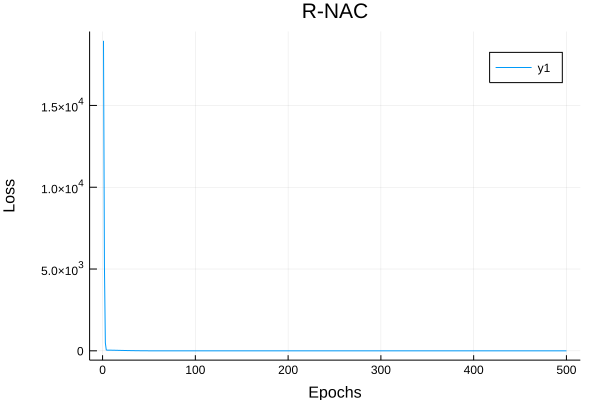

In [9]:
rnac = Chain(RNAC(2, 2), NAC(2, 1))
rnac_opt = ADAM(params(rnac))
rnac_loss = loss(f, rnac)
hist = train_model(rnac_loss, rnac_opt, add_data_train, add_data_val, epochs)
@info "Validation loss", hist[end]
@info "Test loss", mean(rnac_loss(d...) for d in add_data_test) |> Flux.data
plot(hist, title="R-NAC", xlabel="Epochs", ylabel="Loss")

## `RNALU`

┌ Info: Iteration 10 - Validation loss = 20.497139613003853
└ @ Main In[5]:16
┌ Info: Iteration 20 - Validation loss = 12.103747950376565
└ @ Main In[5]:16
┌ Info: Iteration 30 - Validation loss = 7.070364323049122
└ @ Main In[5]:16
┌ Info: Iteration 40 - Validation loss = 3.722828950909344
└ @ Main In[5]:16
┌ Info: Iteration 50 - Validation loss = 1.6393725161049675
└ @ Main In[5]:16
┌ Info: Iteration 60 - Validation loss = 0.5989035405551377
└ @ Main In[5]:16
┌ Info: Iteration 70 - Validation loss = 0.3204969899829151
└ @ Main In[5]:16
┌ Info: Iteration 80 - Validation loss = 0.25891088215754027
└ @ Main In[5]:16
┌ Info: Iteration 90 - Validation loss = 0.24016009766194885
└ @ Main In[5]:16
┌ Info: Iteration 100 - Validation loss = 0.23116855639409678
└ @ Main In[5]:16
┌ Info: Iteration 110 - Validation loss = 0.22458695763071146
└ @ Main In[5]:16
┌ Info: Iteration 120 - Validation loss = 0.21666393266424394
└ @ Main In[5]:16
┌ Info: Iteration 130 - Validation loss = 0.20546555165913

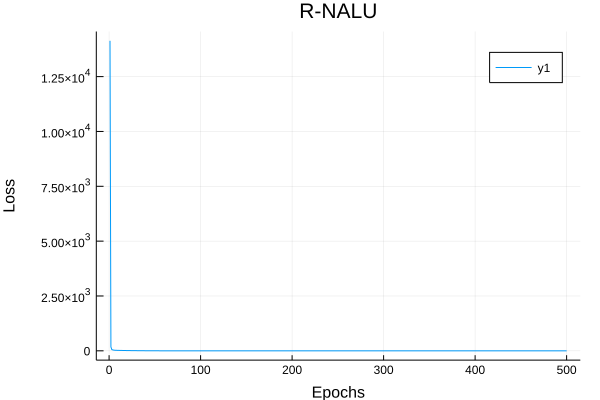

In [10]:
rnalu = Chain(RNALU(2, 2), NALU(2, 1))
rnalu_opt = ADAM(params(rnalu))
rnalu_loss = loss(f, rnalu)
hist = train_model(rnalu_loss, rnalu_opt, add_data_train, add_data_val, epochs)
@info "Validation loss", hist[end]
@info "Test loss", mean(rnalu_loss(d...) for d in add_data_test) |> Flux.data
plot(hist, title="R-NALU", xlabel="Epochs", ylabel="Loss")

Notice `RNAC` and `RNALU` both have a significantly lower test loss score than the `LSTM` while the validation scores are similar. This implies `RNAC` and `RNALU` generalize to longer sequences much better than the `LSTM`.